## Bachelor Thesis
## "Exploring the Efficacy of Diverse Classification Techniques In Detecting Disinformation In News."
Ilia Sokolovskiy
HTW SS23

Notebook 1/5 - Data Preparation

**Installing all necessary dependencies**

In [2]:
%%capture
!pip install -U spacy && python -m spacy download en_core_web_lg && pip install vaderSentiment tqdm wordcloud

**Importing all necessary libraries**

In [9]:
import os
import re

import pandas as pd
import spacy
from spacy.tokens import DocBin
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from tqdm.notebook import tqdm
import plotly.express as px
import plotly.figure_factory as ff
import matplotlib.pyplot as plt
from wordcloud import WordCloud

> Execute the following 5 cells if you want to load the locally pre-saved DocBin and Pickle, otherwise skip

In [33]:
# Load the large spaCy model, but with disabled pipeline elements that aren't needed
nlp = spacy.load('en_core_web_lg', disable=['textcat', 'parser', 'custom'])

In [34]:
# Load a DockBin with spaCy docs
# This might take a couple of minutes
db = DocBin()
base_dir = "Data"
db_folder = "DocBins"
filename_db = "db_lg_custom_pl_1.spacy"

full_path_db = os.path.join(base_dir, db_folder, filename_db)

db.from_disk(full_path_db)
docs = list(db.get_docs(nlp.vocab))

In [10]:
# Load the pickle with the df
pickle_folder = "Pickles"
filename_pickle = "pickle_lg_df_2.pkl"

full_path_pickle = os.path.join(base_dir, pickle_folder, filename_pickle)

df = pd.read_pickle(full_path_pickle)

In [36]:
# Add the docs to the df
df['spacy_docs'] = docs
df.head()

,text,label,label_encoded,norp_count,gpe_count,vader_compound,cleaned_text,original_text_vector,cleaned_text_vector,spacy_docs
0,Donald Trump just couldn t wish all Americans ...,FAKE,0,3,3,-0.8681,donald trump couldn t wish americans happy new...,"[-1.6619356, -0.0073223817, -1.6303111, -0.190...","[-0.17023614, 1.1278214, -2.2035916, -1.195557...","(Donald, Trump, just, couldn, t, wish, all, Am..."
1,House Intelligence Committee Chairman Devin Nu...,FAKE,0,10,5,-0.7141,house intelligence committee chairman devin nu...,"[-2.008067, 0.6831929, -1.9811207, 0.52264357,...","[-0.3486856, 0.6266792, -1.7451725, 0.01966631...","(House, Intelligence, Committee, Chairman, Dev..."
2,"On Friday, it was revealed that former Milwauk...",FAKE,0,1,4,-0.9953,friday reveal milwaukee sheriff david clarke c...,"[-1.9425699, 0.0044210483, -1.7258451, 0.00323...","[-0.34773135, 0.7257386, -1.7822778, 0.2710289...","(On, Friday, ,, it, was, revealed, that, forme..."
3,"On Christmas day, Donald Trump announced that ...",FAKE,0,0,2,-0.9176,christmas day donald trump announce work follo...,"[-1.6670086, 0.23368433, -0.6346163, 0.1001595...","[-0.18105617, 0.730818, -0.28500575, -0.608257...","(On, Christmas, day, ,, Donald, Trump, announc..."
4,Pope Francis used his annual Christmas Day mes...,FAKE,0,2,5,0.3134,pope francis annual christmas day message rebu...,"[-2.141846, 1.1239394, -2.4791837, 0.000615673...","[-0.003997393, 1.3095359, -2.2471106, -0.14267...","(Pope, Francis, used, his, annual, Christmas, ..."


This is what the final full dataframe looks like, before being passed into the notebooks for data splitting and model training.
(except the spaCy docs aren't there anymore and here they are added as a new column purely for demonstration purposes)

In [37]:
# Check if the data type of elements in the spaCy docs column is preserved
print(type(df['spacy_docs'][0]))

<class 'spacy.tokens.doc.Doc'>


> End of the cells for pre-saved data loading.

**Labeling, merging and saving datasets**

In [12]:
try:
    # Filepaths
    base_dir = "Data"
    input_csv_file_1 = os.path.join(base_dir, "DataSet_Misinfo_FAKE.csv")
    input_csv_file_2 = os.path.join(base_dir, "DataSet_Misinfo_TRUE.csv")

    df = pd.read_csv(input_csv_file_1, index_col=0, encoding='utf-8')
    df2 = pd.read_csv(input_csv_file_2, index_col=0, encoding='utf-8')

    # Add new 'label' columns
    df['label'] = "FAKE"
    df2['label'] = "TRUE"

    print("Shape of FAKE dataset:", df.shape)
    print("Shape of TRUE dataset:", df2.shape)

    # Combine DataFrames
    combined_df = pd.concat([df, df2], ignore_index=True)

    # Output filepaths
    combined_output_file = os.path.join(base_dir, "DataSet_Misinfo_FAKE+TRUE.csv")

    # Save combined DataFrames
    if os.path.exists(combined_output_file):
        print(f"Warning: {combined_output_file} already exists! Delete it first if you wish to overwrite it.")
    else:
        combined_df.to_csv(combined_output_file, index=False)
        print("Datasets successfully combined and saved to output file!")

except FileNotFoundError as fnf_error:
    print(f"File not found: {fnf_error}")
except Exception as e:
    print(f"An error occurred: {e}")

Shape of FAKE dataset: (43642, 2)
Shape of TRUE dataset: (34975, 2)
Datasets successfully combined and saved to output file!


**Analysing & cleaning data**

In [13]:
combined_csv = os.path.join(base_dir, "DataSet_Misinfo_FAKE+TRUE.csv")
data = pd.read_csv(combined_csv, encoding='utf-8')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 78617 entries, 0 to 78616
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    78588 non-null  object
 1   label   78617 non-null  object
dtypes: object(2)
memory usage: 1.2+ MB


In [14]:
# Print NaN values
null_counts = data.isna().sum()
print(null_counts)

text     29
label     0
dtype: int64


In [15]:
# Drop NaN values
data.dropna(inplace=True)

In [16]:
# Removing all URLs using regex (regular expressions)
def remove_urls(text):
    no_urls = re.sub(r'\b\S+\.\S+', '', text)
    return no_urls

data['text'] = data['text'].apply(remove_urls)

In [17]:
print("Shape of the data:", data.shape)
print("Unique value counts per column:")
print(data.nunique())

Shape of the data: (78588, 2)
Unique value counts per column:
text     68550
label        2
dtype: int64


In [18]:
duplicate_texts_count = data[data.duplicated(subset=['text'])].shape[0]
print(f"The number of duplicate texts is: {duplicate_texts_count}")

The number of duplicate texts is: 10038


In [19]:
# Removing all duplicates
data = data.drop_duplicates(subset=['text'])

In [20]:
# Encode the label as 1 or 0 for later usage
data['label_encoded'] = data['label'].map({'TRUE': 1, 'FAKE': 0})

In [21]:
print("Shape of the data:", data.shape)
print("Unique value counts per column:")
print(data.nunique())

Shape of the data: (68550, 3)
Unique value counts per column:
text             68550
label                2
label_encoded        2
dtype: int64


In [22]:
# Calculating length of each row in characters
data['char_count'] = data['text'].str.len()

In [23]:
print("Statistical summary for character counts across dataset:")
print(data['char_count'].describe().astype(int))

Statistical summary for character counts across dataset:
count     68550
mean       2877
std        3542
min           0
25%         860
50%        2118
75%        3584
max      142139
Name: char_count, dtype: int32


In [24]:
fig = px.box(data, y='char_count', title='Distribution of Character Counts')
fig.show()

In [25]:
# Rows with the top 100 largest 'char_count' values
top_100_longest_texts = data.nlargest(100, 'char_count')

# Rows with the top 100 smallest 'char_count' values
top_100_shortest_texts = data.nsmallest(100, 'char_count')

In [26]:
top_100_longest_texts

,text,label,label_encoded,char_count
32630,Заседание Международного дискуссионного клуба ...,FAKE,0,142139
29538,The Hard Working American vs. The Government P...,FAKE,0,133327
26565,Why Are So Many People Choosing To Leave The U...,FAKE,0,114772
27145,How Many People Will Have To Migrate Out Of Ca...,FAKE,0,114255
29925,It Is Now Mathematically Impossible To Pay Off...,FAKE,0,98237
...,...,...,...,...
71326,"JIDDA, Saudi Arabia — For most of his adult...",TRUE,1,33405
69641,Hours before the start of the Women’s March on...,TRUE,1,33398
74802,COVFEFE from Union Pub on Capitol Hill! [Forme...,TRUE,1,33084
21765,Patrick Henningsen 21st Century WireToday Amer...,FAKE,0,32893


In [27]:
top_100_shortest_texts

,text,label,label_encoded,char_count
9358,,FAKE,0,0
23235,f,FAKE,0,1
29720,🙂,FAKE,0,1
25761,In,FAKE,0,3
68620,No.,TRUE,1,3
...,...,...,...,...
11677,HE WILL NOT DIVIDE US .,FAKE,0,23
13963,Spread this EVERYWHERE!,FAKE,0,23
15049,"NO, NO. YOU RE FINISHED",FAKE,0,23
18727,"Sacrifice, pride, honor",FAKE,0,23


In [28]:
# Un-skewing the data by trimming the extremes
lower_bound = data['char_count'].quantile(0.01)
upper_bound = data['char_count'].quantile(0.95)

trimmed_data = data[(data['char_count'] > lower_bound) & (data['char_count'] < upper_bound)]

In [29]:
print("Statistical summary for character counts across dataset:")
print(trimmed_data['char_count'].describe().astype(int))

Statistical summary for character counts across dataset:
count    64429
mean      2363
std       1859
min         62
25%        828
50%       2040
75%       3238
max       8120
Name: char_count, dtype: int32


In [30]:
fig = px.box(trimmed_data, y='char_count', title='Character Counts Distribution')
fig.update_yaxes(title_text='Text Length (in char)')
fig.show()

In [31]:
label_counts = trimmed_data['label'].value_counts()
print(label_counts)

TRUE    32485
FAKE    31944
Name: label, dtype: int64


In [32]:
# Aggregating the dataframe by the 'label' column
label_counts = trimmed_data['label'].value_counts().reset_index()
label_counts.columns = ['label', 'count']

fig = px.bar(label_counts, x='label', y='count', title='TRUE vs FAKE',
             labels={'label': 'Label', 'count': 'Number of Texts'},
             color='label', color_discrete_map={'TRUE': 'green', 'FAKE': 'red'})

fig.show()

In [42]:
fig = px.histogram(trimmed_data, x='char_count', color='label', color_discrete_map={'TRUE': 'green', 'FAKE': 'red'},
                   barmode='group',
                   title='Text Length Distribution by Label')
fig.update_xaxes(title_text='Text Length (in char)')
fig.show()

**Tokenization with spaCy**

In [29]:
# Load the large spaCy model with disabled pipeline components that won't be needed
nlp = spacy.load('en_core_web_lg', disable=['textcat', 'parser', 'custom'])

In [69]:
# Load the large spaCy model (full pipeline for comparison)
nlp = spacy.load('en_core_web_lg')

In [70]:
# Testing the custom pipeline for reduced compute load (visualisation of semantic relationships)
# from spacy import displacy
# displacy.render(nlp("My name is Alex. I live and study in Berlin!"))

In [30]:
# Testing the custom pipeline for reduced compute load (visualisation of semantic relationships)
from spacy import displacy
displacy.render(nlp("My name is Alex. I live and study in Berlin!"))

In [31]:
# Testing the custom pipeline for reduced compute load (visualisation of Named Entity Recognition)
displacy.render(nlp("My name is Alex. I live and study in Berlin!"), style='ent')

In [32]:
# Tokenize data with custom spaCy pipeline
texts = trimmed_data['text']
docs = []

for doc in tqdm(nlp.pipe(texts, n_process=4), desc='Tokenizing'):
    docs.append(doc)

print(docs[:1])

Tokenizing: 0it [00:00, ?it/s]

[Donald Trump just couldn t wish all Americans a Happy New Year and leave it at that. Instead, he had to give a shout out to his enemies, haters and  the very dishonest fake news media.  The former reality show star had just one job to do and he couldn t do it. As our Country rapidly grows stronger and smarter, I want to wish all of my friends, supporters, enemies, haters, and even the very dishonest Fake News Media, a Happy and Healthy New Year,  President Angry Pants tweeted.  2018 will be a great year for America! As our Country rapidly grows stronger and smarter, I want to wish all of my friends, supporters, enemies, haters, and even the very dishonest Fake News Media, a Happy and Healthy New Year. 2018 will be a great year for America!  Donald J. Trump (@realDonaldTrump) December 31, 2017Trump s tweet went down about as welll as you d  kind of president sends a New Year s greeting like this despicable, petty, infantile gibberish? Only Trump! His lack of decency won t even allow hi

In [22]:
# Initialise DocBin
db = DocBin()

In [23]:
# Assign docs collection to DocBin
for doc in tqdm(docs, desc='Assigning docs to the DocBin'):
    db.add(doc)

Assigning docs to the DocBin:   0%|          | 0/64429 [00:00<?, ?it/s]

In [24]:
# Save the DocBin locally
base_dir = "Data"
db_folder = "DocBins"
filename_db = "db_lg_custom_pl_1.spacy"

full_path_db = os.path.join(base_dir, db_folder, filename_db)

db.to_disk(full_path_db)

In [34]:
# Adding docs to the dataframe
trimmed_data['spacy_docs'] = docs
trimmed_data.sample(5)

,text,label,label_encoded,char_count,spacy_docs
38090,At least 50 people were killed in a US-led coa...,FAKE,0,152,"(At, least, 50, people, were, killed, in, a, U..."
67990,An unsettling thing happened at the Olympic di...,TRUE,1,3987,"(An, unsettling, thing, happened, at, the, Oly..."
35044,6 Great Halloween Costume Ideas For Duos Poste...,FAKE,0,1861,"(6, Great, Halloween, Costume, Ideas, For, Duo..."
61731,A 38-year-old refugee from Sri Lanka was shot ...,TRUE,1,694,"(A, 38, -, year, -, old, refugee, from, Sri, L..."
38278,Prominent EU politicians are using all means p...,FAKE,0,317,"(Prominent, EU, politicians, are, using, all, ..."


In [35]:
# Assign trimmed data to a new df (without char count column)
df = trimmed_data.drop(columns='char_count')

**Feature engineering with spaCy pipeline**

In [38]:
# Initialize Vader
vader_sentiment = SentimentIntensityAnalyzer()

def vader_sentiment_scores(text):
    score = vader_sentiment.polarity_scores(text)
    return score['compound']

In [39]:
# Extracting features
num_tokens = []
person_count = []
norp_count = []
gpe_count = []
event_count = []
law_count = []
vader_compound = []

for doc, text in tqdm(zip(df['spacy_docs'], df['text']), total=len(df), desc='Extracting Features'):
    # Text length in tokens
    num_tokens.append(len(doc))

    # Counts of specific named entities (NER)
    entities = [ent.label_ for ent in doc.ents]
    person_count.append(entities.count('PERSON'))
    norp_count.append(entities.count('NORP'))
    gpe_count.append(entities.count('GPE'))
    event_count.append(entities.count('EVENT'))
    law_count.append(entities.count('LAW'))

    # Sentiment analysis with Vader
    vader_compound.append(vader_sentiment_scores(text))

df['num_tokens'] = num_tokens
df['person_count'] = person_count
df['norp_count'] = norp_count
df['gpe_count'] = gpe_count
df['event_count'] = event_count
df['law_count'] = law_count
df['vader_compound'] = vader_compound

Extracting Features:   0%|          | 0/64429 [00:00<?, ?it/s]

In [46]:
df.sample(5)

,text,label,label_encoded,spacy_docs,num_tokens,person_count,norp_count,gpe_count,event_count,law_count,vader_compound
71241,An Muslim woman who claimed that three men ...,TRUE,1,"(An, , Muslim, woman, who, claimed, that, t...",297,4,2,3,0,0,-0.9701
23123,"In this Ted Talk , Michael Murphy discusses ho...",FAKE,0,"(In, this, Ted, Talk, ,, Michael, Murphy, disc...",768,10,1,4,0,0,0.9991
62333,The anti-immigrant Alternative for Germany (Af...,TRUE,1,"(The, anti, -, immigrant, Alternative, for, Ge...",367,5,9,3,1,0,0.2732
64340,The European Union s chief Brexit negotiator s...,TRUE,1,"(The, European, Union, s, chief, Brexit, negot...",61,2,0,4,0,0,-0.1280
63760,A blaze at an Islamic boarding school in the M...,TRUE,1,"(A, blaze, at, an, Islamic, boarding, school, ...",674,8,3,4,0,0,-0.9927


In [50]:
print("Statistical report for all features that are of integer type:")
# Select all integer columns
integer_columns = [col for col in df.columns if col != 'vader_compound' and col != 'label_encoded']
print(df[integer_columns].describe().astype(int))

Statistical report for all features that are of integer type:
       num_tokens  person_count  norp_count  gpe_count  event_count  law_count
count       64429         64429       64429      64429        64429      64429
mean          458            11           3          6            0          0
std           364            12           5          8            0          0
min             8             0           0          0            0          0
25%           159             3           1          1            0          0
50%           396             8           2          3            0          0
75%           628            16           5          8            0          0
max          1857           166          84        130           36         26


In [53]:
print("Statistical report for the vader compound feature:")
print(df['vader_compound'].describe().round(1))

Statistical report for the vader compound feature:
count    64429.0
mean         0.0
std          0.8
min         -1.0
25%         -0.9
50%          0.0
75%          0.9
max          1.0
Name: vader_compound, dtype: float64


In [34]:
# Checkpoint into a pickle without massive spaCy docs
base_dir = "Data"
pickle_folder = "Pickles"
filename_pickle = "pickle_lg_1.pkl"

full_path_pickle = os.path.join(base_dir, pickle_folder, filename_pickle)

df.drop(columns='spacy_docs').to_pickle(full_path_pickle)

**Visualising the data before pre-processing**

In [54]:
# Correlation matrix for all features
correlation_matrix = df.corr(numeric_only=True).round(3)

In [55]:
# Get column names
columns = correlation_matrix.columns.tolist()

# Heatmap for all the engineered features
fig = ff.create_annotated_heatmap(
    z=correlation_matrix.values,
    x=columns,
    y=columns,
    colorscale='Viridis'
)

fig.update_layout(title='Correlation Matrix - all of the created features and the encoded label')
fig.show()

In [56]:
# From counts keeping only the 2 features that have the highest correlation towards the label + vader compound, dropping the rest
df.drop(columns=['num_tokens','person_count', 'event_count', 'law_count'], inplace=True)

In [57]:
# Correlation matrix for the left-over features
correlation_matrix = df.corr(numeric_only=True).round(3)

In [58]:
# Get column names
columns = correlation_matrix.columns.tolist()

# Heatmap for the left-over features
fig = ff.create_annotated_heatmap(
    z=correlation_matrix.values,
    x=columns,
    y=columns,
    colorscale='Viridis'
)

fig.update_layout(title='Correlation Matrix - the only kept features and the encoded label')
fig.show()

In [9]:
# Scatter plot for the relationship between Vader Compound and the count of NORP (Nationalities, Religious, Political) groups
fig = px.scatter(df, x='vader_compound', y='norp_count', color='label', color_discrete_map={'TRUE': 'green', 'FAKE': 'red'},
                 labels={'vader_compound': 'Sentiment Vader Compound Score', 'norp_count': 'NORP groups (count)'},
                 title='Vader Compound vs Number of Nationalities or Religious or Political groups')
fig.show()

In [10]:
# Scatter plot for the relationship between Vader Compound and the count of GPE (Geopolitical Entities) groups
fig = px.scatter(df, x='vader_compound', y='gpe_count', color='label', color_discrete_map={'TRUE': 'green', 'FAKE': 'red'},
                 labels={'vader_compound': 'Sentiment Vader Compound Score', 'gpe_count': 'Geopolitical Entities (count)'},
                 title='Vader Compound vs Number of Geopolitical Entities')

fig.show()

In [63]:
df.sample(5)

,text,label,label_encoded,spacy_docs,norp_count,gpe_count,vader_compound
64363,"Up to 300,000 Rohingya Muslims could flee viol...",TRUE,1,"(Up, to, 300,000, Rohingya, Muslims, could, fl...",3,8,-0.9945
54420,Duane Oreskowic was speechless when he learned...,TRUE,1,"(Duane, Oreskowic, was, speechless, when, he, ...",6,7,0.9489
68750,An international tribunal in The Hague release...,TRUE,1,"(An, international, tribunal, in, The, Hague, ...",13,47,0.8508
23794,Director de 'Machete' y 'El Mariachi' insta a ...,FAKE,0,"(Director, de, ', Machete, ', y, ', El, Mariac...",0,10,-0.8020
60884,"Zuo Aining has always been a striver, always m...",TRUE,1,"(Zuo, Aining, has, always, been, a, striver, ,...",0,5,0.6597


**Pre-processing and vectorising textual data with spaCy**

In [64]:
# Progress bar visualisation that is utilized while calling the progress_apply() method
tqdm.pandas()

def preprocess(spacy_doc):
    # Lemmatize & lowercase text, while keeping only alphabetic values and removing stopwords, punctuation and out of vocabulary tokens
    tokens = [token.lemma_.lower() for token in spacy_doc if token.is_alpha and not token.is_stop and not token.is_punct and not token.is_oov]

    return ' '.join(tokens)

df['cleaned_text'] = df['spacy_docs'].progress_apply(preprocess)

  0%|          | 0/64429 [00:00<?, ?it/s]

In [65]:
df.sample(5)

,text,label,label_encoded,spacy_docs,norp_count,gpe_count,vader_compound,cleaned_text
61248,A series of tremors and landslides near North ...,TRUE,1,"(A, series, of, tremors, and, landslides, near...",0,7,-0.5346,series tremor landslide near north korea s nuc...
14363,The LGBT mafia has never been more threatening...,FAKE,0,"(The, LGBT, mafia, has, never, been, more, thr...",0,2,-0.9242,lgbt mafia threatening powerful transsexual pe...
5909,The United States just experienced its worst m...,FAKE,0,"(The, United, States, just, experienced, its, ...",4,6,-0.9956,united states experience bad mass shooting his...
10656,President Trump spoke in the Rose Garden today...,FAKE,0,"(President, Trump, spoke, in, the, Rose, Garde...",6,2,-0.8847,president trump speak rose garden today presse...
37211,This law is not about protecting the Ukrainian...,FAKE,0,"(This, law, is, not, about, protecting, the, U...",3,0,0.0000,law protect ukrainian language prohibit russia...


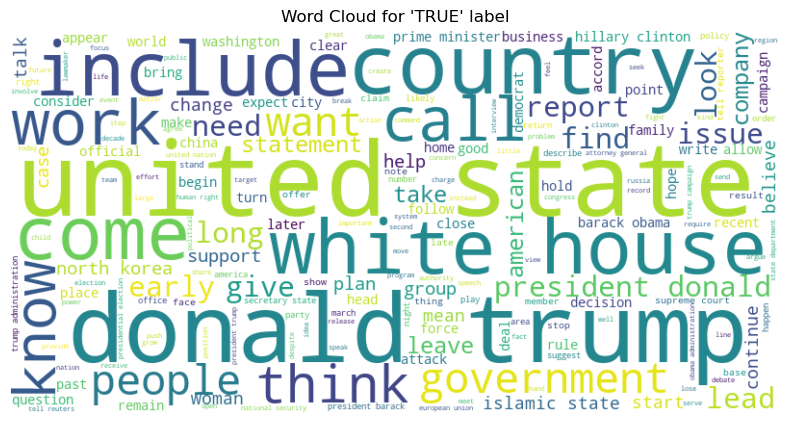

In [15]:
# Filter rows with label 'TRUE' in the column with pre-processed text
true_texts = ' '.join(df[df['label'] == 'TRUE']['cleaned_text'].tolist())

# List of words to exclude
exclude_words = [
    'year', 'month', 'week', 'time',
    'monday', 'tuesday', 'wednesday', 'thursday', 'friday', 'saturday', 'sunday'
]

# Filter out words that are shorter than 4 characters and the specified excluded words
filtered_true_texts = ' '.join([word for word in true_texts.split() if len(word) >= 4 and word not in exclude_words])

wordcloud_true = WordCloud(
    background_color='white',
    width=800,
    height=400
).generate(filtered_true_texts)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_true, interpolation='bilinear')
plt.title("Word Cloud for 'TRUE' label")
plt.axis('off')
plt.show()

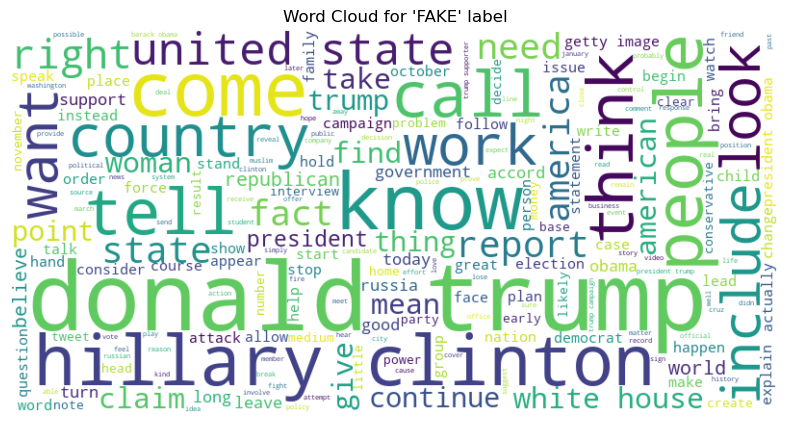

In [16]:
# Filter rows with label 'FAKE' in the column with pre-processed text
fake_texts = ' '.join(df[df['label'] == 'FAKE']['cleaned_text'].tolist())

# List of words to exclude
exclude_words = [
    'year', 'month', 'week', 'time',
    'monday', 'tuesday', 'wednesday', 'thursday', 'friday', 'saturday', 'sunday'
]

# Filter out words that are shorter than 4 characters and the specified excluded words
filtered_fake_texts = ' '.join([word for word in fake_texts.split() if len(word) >= 4 and word not in exclude_words])

wordcloud_fake = WordCloud(
    background_color='white',
    width=800,
    height=400
).generate(filtered_fake_texts)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_fake, interpolation='bilinear')
plt.title("Word Cloud for 'FAKE' label")
plt.axis('off')
plt.show()

In [17]:
# Convert existing docs to vectors
tqdm.pandas()

def vectorize_doc(spacy_doc):
    return spacy_doc.vector

df['original_text_vector'] = df['spacy_docs'].progress_apply(vectorize_doc)

  0%|          | 0/64429 [00:00<?, ?it/s]

In [18]:
# Convert cleaned texts to vectors
vectors = [doc.vector for doc in tqdm(nlp.pipe(df['cleaned_text'].tolist(), n_process=4), desc='Vectorizing cleaned text')]

df['cleaned_text_vector'] = vectors

Vectorizing cleaned text: 0it [00:00, ?it/s]

In [19]:
df.head()

,text,label,label_encoded,norp_count,gpe_count,vader_compound,spacy_docs,cleaned_text,original_text_vector,cleaned_text_vector
0,Donald Trump just couldn t wish all Americans ...,FAKE,0,3,3,-0.8681,"(Donald, Trump, just, couldn, t, wish, all, Am...",donald trump couldn t wish americans happy new...,"[-1.6619356, -0.0073223817, -1.6303111, -0.190...","[-0.17023614, 1.1278214, -2.2035916, -1.195557..."
1,House Intelligence Committee Chairman Devin Nu...,FAKE,0,10,5,-0.7141,"(House, Intelligence, Committee, Chairman, Dev...",house intelligence committee chairman devin nu...,"[-2.008067, 0.6831929, -1.9811207, 0.52264357,...","[-0.3486856, 0.6266792, -1.7451725, 0.01966631..."
2,"On Friday, it was revealed that former Milwauk...",FAKE,0,1,4,-0.9953,"(On, Friday, ,, it, was, revealed, that, forme...",friday reveal milwaukee sheriff david clarke c...,"[-1.9425699, 0.0044210483, -1.7258451, 0.00323...","[-0.34773135, 0.7257386, -1.7822778, 0.2710289..."
3,"On Christmas day, Donald Trump announced that ...",FAKE,0,0,2,-0.9176,"(On, Christmas, day, ,, Donald, Trump, announc...",christmas day donald trump announce work follo...,"[-1.6670086, 0.23368433, -0.6346163, 0.1001595...","[-0.18105617, 0.730818, -0.28500575, -0.608257..."
4,Pope Francis used his annual Christmas Day mes...,FAKE,0,2,5,0.3134,"(Pope, Francis, used, his, annual, Christmas, ...",pope francis annual christmas day message rebu...,"[-2.141846, 1.1239394, -2.4791837, 0.000615673...","[-0.003997393, 1.3095359, -2.2471106, -0.14267..."


In [20]:
# Checkpoint into a pickle without massive spaCy docs
base_dir = "Data"
pickle_folder = "Pickles"
filename_pickle = "pickle_lg_df_2.pkl"

full_path_pickle = os.path.join(base_dir, pickle_folder, filename_pickle)

df.drop(columns=['spacy_docs']).to_pickle(full_path_pickle)